<a href="https://colab.research.google.com/github/VicWezy/Hotel-Cancellation-Rate-Prediction/blob/main/Hotel_Cancenllation_Prediction_new.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Hotel Cancellation Rate Prediction

## Introduction

In this project, we are focusing on the analysis and prediction of the hotel cancellation rate for the Marriott Hotels. The aim is to gain insights into the factors influencing hotel cancellations and develop a predictive model that can forecast cancellation rates accurately.

**Business Context.** As one of the leading hotel chains globally, Marriott Hotels caters to a wide range of guests, including business travelers and leisure tourists. Efficient management of hotel bookings and cancellations is crucial for optimizing revenue and ensuring guest satisfaction. Understanding the patterns and trends related to cancellations can help Marriott Hotels make informed decisions regarding pricing, resource allocation, and customer service.

**Business Problem.** The hotel industry faces significant challenges due to booking cancellations, which can result in revenue loss and operational inefficiencies. By accurately predicting hotel cancellation rates, Marriott Hotels can proactively address these challenges.

**Analytical Context.** To accomplish this goal, we will leverage a dataset called hotel_bookings.csv. This dataset will serve as the foundation for our analysis and predictive modeling. By analyzing this dataset, we will explore the relationships between different variables and cancellations, uncover patterns, and derive insights that can drive the development of an accurate cancellation rate prediction model.

## Import packages

In [10]:
# Data processing, visualization, modeling, and evaluation
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', 32)
import sort_dataframeby_monthorweek as sd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
import plotly.express as px
%matplotlib inline

# Missing values visualization
import missingno as msno

# Map visualization
import folium
from folium.plugins import HeatMap

# Machine learning modeling related
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, recall_score, roc_auc_score, precision_score, f1_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier

# Deep learning related
import tensorflow as tf
import keras
from keras.layers import Dense
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

## Reading in the dataset

In [104]:
df = pd.read_csv('/hotel_bookings.csv')
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [ ]:
# 1. column info
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [ ]:
# 2、total number of columns
len(df.columns)

32

In [ ]:
# 3、column type
df.dtypes

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

In [ ]:
# 4、count of different column types
df.dtypes.value_counts()

int64      16
object     12
float64     4
dtype: int64

In [ ]:
# 5、data size
df.shape

(119390, 32)

In [ ]:
# 6、descriptive statistics
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


In [ ]:
# 7、data info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

## Missing Values

In [14]:
# Count the number and proportion of missing values for each column

null_df = pd.DataFrame({'Null Values': df.isnull().sum(),
                        'Percentage of Null Values': (df.isnull().sum())/(df.shape[0]) * 100})

null_df

,Null Values,Percentage of Null Values
hotel,0,0.000000
is_canceled,0,0.000000
lead_time,0,0.000000
arrival_date_year,0,0.000000
arrival_date_month,0,0.000000
arrival_date_week_number,0,0.000000
arrival_date_day_of_month,0,0.000000
stays_in_weekend_nights,0,0.000000
stays_in_week_nights,0,0.000000
adults,0,0.000000


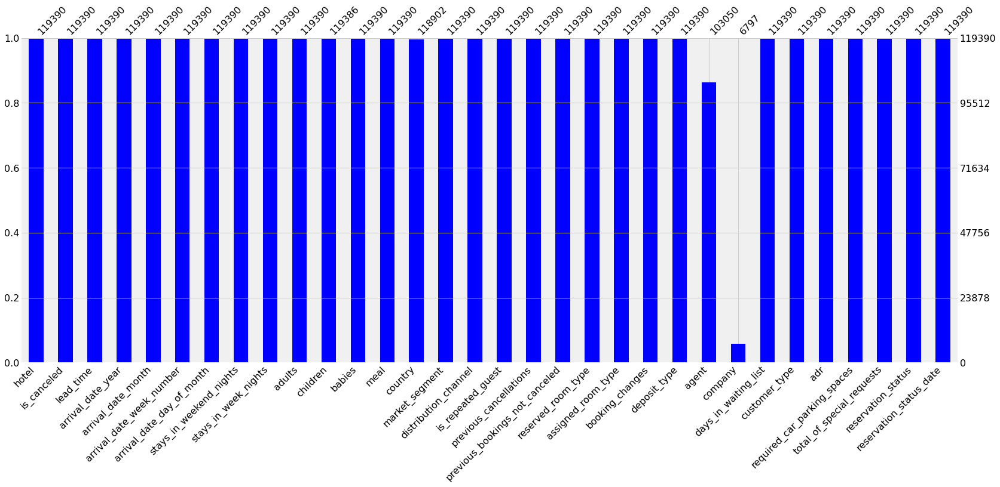

In [ ]:
# Visualize Missing Values

msno.bar(df, color='blue')

plt.show()

### Handling Missing Values

1. The proportion of missing values in `children` and `country` is less than 1%, which is very small; directly delete the part of the missing value

In [105]:
# filter out data with non-missing values

df = df[(df['country'].isnull() == False) & (df['children'].isnull() == False)]

df.columns[df.isnull().sum() != 0]

Index(['agent', 'company'], dtype='object')

2. The proportion of missing values in `company` is as high as 94.3%; consider deleting this column directly

In [106]:
# drop column company

df.drop('company', axis=1, inplace=True)

df.columns[df.isnull().sum() != 0]

Index(['agent'], dtype='object')

3. The proportion of missing values in `agent` (agency fee) is 13.68%, handling as follows:

In [107]:
# check information of agent
df['agent'].value_counts()

9.0      31959
240.0    13871
1.0       7191
14.0      3638
7.0       3539
         ...  
70.0         1
93.0         1
54.0         1
497.0        1
59.0         1
Name: agent, Length: 332, dtype: int64

In [108]:
# use a violin plot to visualize the distribution of the data
px.violin(y=df['agent'])

Values can use to impute, such as:

0: Unable to determine the specific data of the missing value

9: Mode

mean: the mean of the existing values

In [109]:
# impute with 0

df['agent'].fillna(0,inplace=True)

df.columns[df.isnull().sum() != 0]

Index([], dtype='object')

## Unreasonable Values

1. Number of occupants cannot be 0

    The number of `adults`, `children`, and `babies` in a room cannot be 0 at the same time:

In [110]:
special = (df['adults'] == 0) & (df['children'] == 0) & (df['babies'] == 0)
special.head()

0    False
1    False
2    False
3    False
4    False
dtype: bool

In [111]:
# exclude special cases

df = df[~special]

df[special].sum()

hotel                             0.0
is_canceled                       0.0
lead_time                         0.0
arrival_date_year                 0.0
arrival_date_month                0.0
arrival_date_week_number          0.0
arrival_date_day_of_month         0.0
stays_in_weekend_nights           0.0
stays_in_week_nights              0.0
adults                            0.0
children                          0.0
babies                            0.0
meal                              0.0
country                           0.0
market_segment                    0.0
distribution_channel              0.0
is_repeated_guest                 0.0
previous_cancellations            0.0
previous_bookings_not_canceled    0.0
reserved_room_type                0.0
assigned_room_type                0.0
booking_changes                   0.0
deposit_type                      0.0
agent                             0.0
days_in_waiting_list              0.0
customer_type                     0.0
adr         

2. Outliers: adr (Average Daily Rate)

In [112]:
df['adr'].value_counts().sort_index()

-6.38          1
 0.00       1799
 0.26          1
 0.50          1
 1.00         14
            ... 
 450.00        1
 451.50        1
 508.00        1
 510.00        1
 5400.00       1
Name: adr, Length: 8857, dtype: int64

Values cannot be negative.

The maximum value is 5400, indicating it is an outlier.

In [53]:
# use a violin plot to visualize the distribution of the data
px.violin(df['adr'])

In [23]:
# use a box plot to visualize the distribution of the data
px.box(df,y='adr')

Before handling, there is a obvious outlier.

In [113]:
# remove outliers
df = df[(df['adr'] >= 0) & (df['adr'] < 1000)]

In [25]:
# use a violin plot to visualize the distribution after handling
px.violin(df['adr'])

In [26]:
# use a box plot to visualize the distribution after handling
px.box(df,y='adr',color='hotel')

## Exploratory Data Analysis

### Compare the number of cancelled and non-cancelled customers

In [ ]:
df['is_canceled'].value_counts()

0    74589
1    44137
Name: is_canceled, dtype: int64

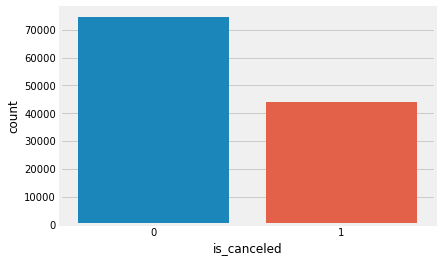

In [ ]:
# Plotting a bar chart to compare the number of: 0 - Non-cancelled, 1 - Cancelled
sns.countplot(df['is_canceled'])
plt.show()

### Where do the non-cancelled customers come from?

In [115]:
# non-cancelled data
data_no_cancel = df[df.is_canceled == 0]

number_no_cancel = data_no_cancel['country'].value_counts().reset_index()
number_no_cancel.columns = ['country', 'number no cancelled']

number_no_cancel

,country,number no cancelled
0,PRT,20977
1,GBR,9667
2,FRA,8468
3,ESP,6383
4,DEU,6067
...,...,...
160,BHR,1
161,DJI,1
162,MLI,1
163,NPL,1


In [ ]:
# map visualization
basemap = folium.Map()
guests_map = px.choropleth(number_no_cancel, # Input data
                           locations= number_no_cancel['country'], # Geographic locations
                           color= number_no_cancel['number no cancelled'], # Color values
                           hover_name= number_no_cancel['country'] # Hover information
                           )
guests_map.show()

**Conclusion 1: The customers who make reservations non-cancelled are mainly from Portugal, most of them are from European countries.**

### What are the average daily price of rooms?

In [ ]:
# create a boxplot to visualize the data
px.box(data_no_cancel,
       x = 'reserved_room_type', # x-axis
       y = 'adr', # y-axis
       color = 'hotel', # Color grouping
       template= 'plotly_dark', # plot theme
       category_orders={'reserved_room_type': ["A", "B", "C", "D", "E", "F", "G", "H", "L"]} # specify category order
       )

**Conclusion 2: The average price of each room depends on its type and standard deviation.**

### What is the price per night all year round?

In [ ]:
# the average price of two different types of hotels throughout the year

data_resort = data_no_cancel[data_no_cancel['hotel'] == 'Resort Hotel']
data_city = data_no_cancel[data_no_cancel['hotel'] == 'City Hotel']

resort_hotel = data_resort.groupby(['arrival_date_month'])['adr'].mean().reset_index()
city_hotel = data_city.groupby(['arrival_date_month'])['adr'].mean().reset_index()

In [ ]:
# merge two data

total_hotel = pd.merge(resort_hotel, city_hotel, on='arrival_date_month')
total_hotel.columns = ['month', 'price_resort', 'price_city']

total_hotel

,month,price_resort,price_city
0,April,76.176140,111.962267
1,August,181.348715,118.674598
2,December,68.634584,88.401855
3,February,54.468180,86.520062
4,January,48.994018,82.330983
5,July,150.483553,115.818019
6,June,108.133154,117.874360
7,March,57.433661,90.658533
8,May,76.734804,120.669827
9,November,48.882907,86.946178


In [ ]:
# custom sorting function
def sort_month(df, column):
    result = sd.Sort_Dataframeby_Month(df, column)
    return result

In [ ]:
new_total_hotel = sort_month(total_hotel, 'month')
new_total_hotel

,month,price_resort,price_city
0,January,48.994018,82.330983
1,February,54.468180,86.520062
2,March,57.433661,90.658533
3,April,76.176140,111.962267
4,May,76.734804,120.669827
5,June,108.133154,117.874360
6,July,150.483553,115.818019
7,August,181.348715,118.674598
8,September,96.288897,112.776582
9,October,61.932777,102.004672


In [ ]:
# Line plot: Price per night over the months

px.line(new_total_hotel,
        x= 'month',
        y= ['price_resort', 'price_city'],
        title= 'Price per night over the Months',
        template= 'plotly_dark'
        )

**Conclusion 3:**
- The price of Resort Hotel in summer is significantly higher than that of City Hotel.
- The price change of City Hotel is relatively smaller. But City Hotel prices are already high starting in April and continuing into September.

### KDE Plot
A KDE (Kernel Density Estimation) plot is a smoothed version of a histogram. It provides a visual representation of the distribution of data in different scenarios.

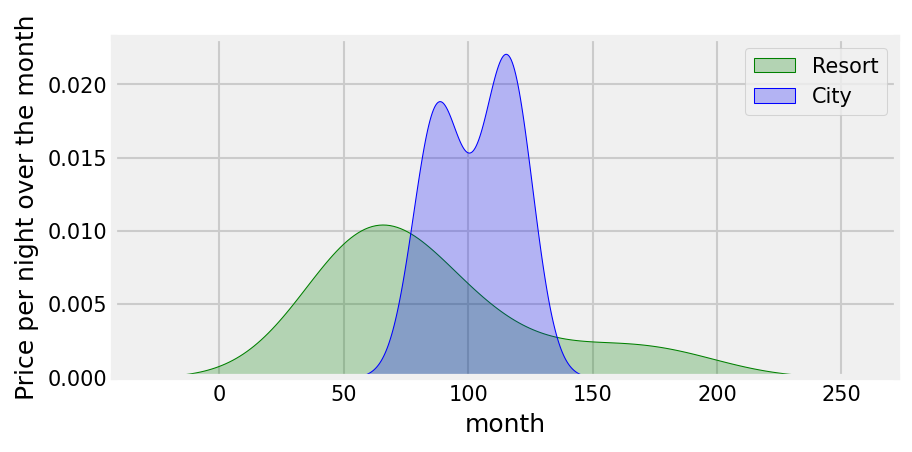

In [ ]:
plt.figure(figsize=(6,3), dpi=150)

ax = sns.kdeplot(new_total_hotel["price_resort"],
                 color="green",
                 shade=True)

ax = sns.kdeplot(new_total_hotel["price_city"],
                 color="blue",
                 shade=True)

ax.set_xlabel("month")
ax.set_ylabel("Price per night over the month")
ax = ax.legend(["Resort","City"])

### The busiest months

In [ ]:
resort_guests = data_resort['arrival_date_month'].value_counts().reset_index()
resort_guests.columns=['Month','No_Resort_Guests']

city_guests = data_city['arrival_date_month'].value_counts().reset_index()
city_guests.columns=['Month','No_City_Guests']

# merge two data
final_guests = pd.merge(resort_guests, city_guests)

# sort by month
new_final_guests = sort_month(final_guests, 'Month')
new_final_guests

,Month,No_Resort_Guests,No_City_Guests
0,January,1812,2249
1,February,2253,3051
2,March,2516,4049
3,April,2518,4010
4,May,2523,4568
5,June,2026,4358
6,July,3110,4770
7,August,3237,5367
8,September,2077,4283
9,October,2528,4326


In [ ]:
# Line plot: Number of guests per Month
px.line(new_final_guests,
        x = "Month",
        y = ["No_Resort_Guests", "No_City_Guests"],
        title = "Number of guests per Month",
        template = "plotly_dark"
       )

**Conclusion 4:**
- The number of guests in City Hotel is higher than that of Resort Hotel, which is more popular
- During July-August at City Hotel and Resort Hotel, despite the high prices, the number of guests also reached a peak
- Both hotels have very few guests in winter

### How long do guests stay?

In [116]:
data_no_cancel['total_nights'] = data_no_cancel['stays_in_weekend_nights'] + data_no_cancel['stays_in_week_nights']

# Statistics of two different hotels based on different lengths of stay:

stay_groupby = (data_no_cancel.groupby(['total_nights', 'hotel'])["is_canceled"]
                .agg("count")
                .reset_index()
                .rename(columns={"is_canceled":"Number of stays"}))

stay_groupby.head()

,total_nights,hotel,Number of stays
0,0,City Hotel,251
1,0,Resort Hotel,366
2,1,City Hotel,9155
3,1,Resort Hotel,6368
4,2,City Hotel,10983


In [117]:
# Generate a grouped bar chart
px.bar(stay_groupby,
       x = "total_nights",
       y = "Number of stays",
       color = "hotel",
       barmode = "group"
      )

## Data Pre Processing

### Correlation Analysis

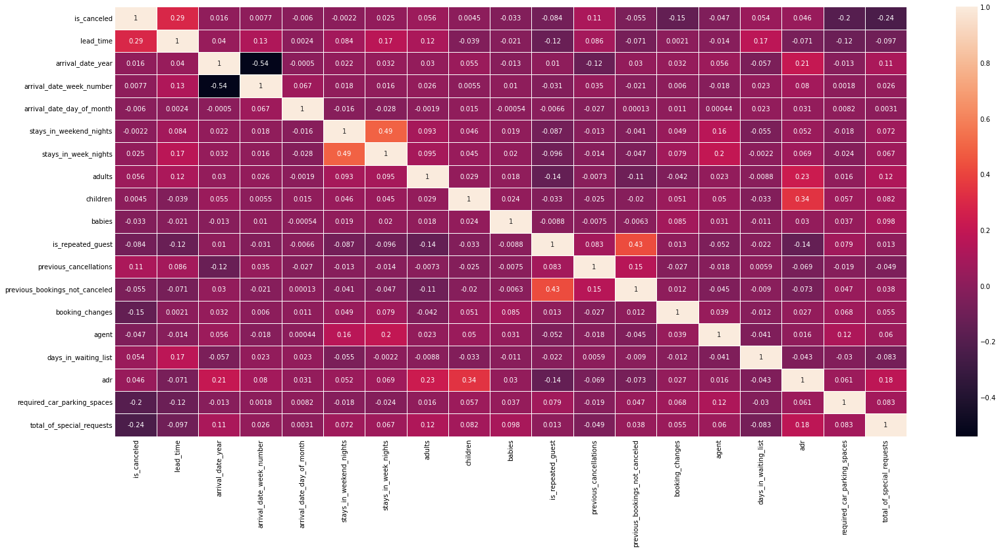

In [ ]:
plt.figure (figsize=(24,12))

corr = df.corr()
sns.heatmap(corr, annot = True, linewidths = 1)
plt.show()

In [ ]:
# Calculate the absolute correlation values between each feature and the target variable "is_canceled", and sort them in descending order:
corr_with_iscanceled = df.corr()['is_canceled'].abs().sort_values(ascending=False)

corr_with_iscanceled

is_canceled                       1.000000
lead_time                         0.291619
total_of_special_requests         0.235923
required_car_parking_spaces       0.195013
booking_changes                   0.145139
previous_cancellations            0.109911
is_repeated_guest                 0.084115
adults                            0.056129
previous_bookings_not_canceled    0.055494
days_in_waiting_list              0.054114
agent                             0.046842
adr                               0.045910
babies                            0.032605
stays_in_week_nights              0.024825
arrival_date_year                 0.016419
arrival_date_week_number          0.007668
arrival_date_day_of_month         0.006022
children                          0.004536
stays_in_weekend_nights           0.002192
Name: is_canceled, dtype: float64

In [61]:
# remove inrrelevant columns according to domain knowledge
no_use_col = ['arrival_date_year', 'assigned_room_type',
             'booking_changes','reservation_status',
             'country', 'days_in_waiting_list']

df.drop(no_use_col, axis=1, inplace=True)

## Feature Engineering

### Categorical Variable Processing

In [27]:
# type of Series data
df['hotel'].dtype

dtype('O')

In [62]:
# categorical variable columns
cat_cols = [col for col in df.columns if df[col].dtype == df["hotel"].dtype]
cat_cols

['hotel',
 'arrival_date_month',
 'meal',
 'market_segment',
 'distribution_channel',
 'reserved_room_type',
 'deposit_type',
 'customer_type',
 'reservation_status_date']

In [63]:
# create a DataFrame of categorical variable columns
cat_df = df[cat_cols]
cat_df.dtypes

hotel                      object
arrival_date_month         object
meal                       object
market_segment             object
distribution_channel       object
reserved_room_type         object
deposit_type               object
customer_type              object
reservation_status_date    object
dtype: object

- Datetime data handling

In [65]:
# Convert to datetime data type
cat_df['reservation_status_date'] = pd.to_datetime(cat_df['reservation_status_date'])

# Extract year, month, and day
cat_df["year"] = cat_df['reservation_status_date'].dt.year
cat_df['month'] = cat_df['reservation_status_date'].dt.month
cat_df['day'] = cat_df['reservation_status_date'].dt.day

- Remove irrelevant columns

In [66]:
cat_df.drop(['reservation_status_date', 'arrival_date_month'], axis=1, inplace=True)

**Unique values for each column**

In [67]:
for col in cat_df.columns:
    print(f"{col}: \n{np.sort(cat_df[col].unique())}\n")

hotel: 
['City Hotel' 'Resort Hotel']

meal: 
['BB' 'FB' 'HB' 'SC' 'Undefined']

market_segment: 
['Aviation' 'Complementary' 'Corporate' 'Direct' 'Groups' 'Offline TA/TO'
 'Online TA']

distribution_channel: 
['Corporate' 'Direct' 'GDS' 'TA/TO' 'Undefined']

reserved_room_type: 
['A' 'B' 'C' 'D' 'E' 'F' 'G' 'H' 'L']

deposit_type: 
['No Deposit' 'Non Refund' 'Refundable']

customer_type: 
['Contract' 'Group' 'Transient' 'Transient-Party']

year: 
[2014 2015 2016 2017]

month: 
[ 1  2  3  4  5  6  7  8  9 10 11 12]

day: 
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31]



**Feature Encoding**

In [68]:
# hotel
cat_df['hotel'] = cat_df['hotel'].map({'Resort Hotel' : 0,
                                       'City Hotel' : 1})

# meal
cat_df['meal'] = cat_df['meal'].map({'BB' : 0,
                                     'FB': 1,
                                     'HB': 2,
                                     'SC': 3,
                                     'Undefined': 4})

# market segment
cat_df['market_segment'] = (cat_df['market_segment']
                            .map({'Direct': 0,
                                 'Corporate':1,
                                 'Online TA':2,
                                 'Offline TA/TO': 3,
                                 'Complementary': 4,
                                 'Groups': 5,
                                 'Undefined': 6,
                                 'Aviation': 7}))

# distribution channel
cat_df['distribution_channel'] = (cat_df['distribution_channel']
                                  .map({'Direct': 0,
                                        'Corporate': 1,
                                        'TA/TO': 2,
                                        'Undefined': 3,
                                        'GDS': 4}))

# reserved_room_type
cat_df['reserved_room_type'] = (cat_df['reserved_room_type']
                                .map({'C': 0,
                                      'A': 1,
                                      'D': 2,
                                      'E': 3,
                                      'G': 4,
                                      'F': 5,
                                      'H': 6,
                                      'L': 7,
                                      'B': 8}))

# deposit type
cat_df['deposit_type'] = (cat_df['deposit_type']
                          .map({'No Deposit': 0,
                                'Refundable': 1,
                                'Non Refund': 3}))

# customer type
cat_df['customer_type'] = (cat_df['customer_type']
                           .map({'Transient': 0,
                                 'Contract': 1,
                                 'Transient-Party': 2,
                                 'Group': 3})
                          )

# year
cat_df['year'] = cat_df['year'].map({2015: 0, 2014: 1, 2016: 2, 2017: 3})

### Numerical Variable Processing

In [69]:
# filter out categorical variables
num_df = df.drop(columns=cat_cols,axis=1)

# remove target variable
num_df.drop("is_canceled",axis=1,inplace=True)

- Plot all distribution graphs of numerical columns

In [70]:
len(num_df.columns)

15

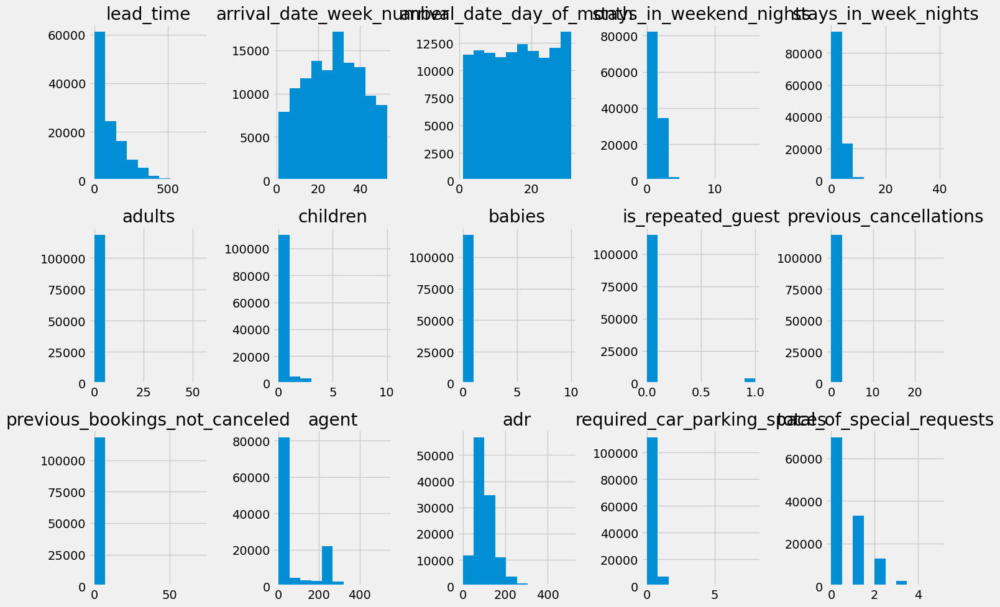

In [71]:
# Define the number of columns and rows for the subplot grid
num_cols = 5  # Number of columns in the grid
num_rows = 3  # Number of rows in the grid

# Create the subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

# Iterate through each column name and plot the distribution
for i, (col_name, col_data) in enumerate(num_df.iteritems()):
    row = i // num_cols  # Calculate the row index in the subplot grid
    col = i % num_cols  # Calculate the column index in the subplot grid

    # Plot the distribution in the corresponding subplot
    axes[row, col].hist(col_data, bins=10)
    axes[row, col].set_title(col_name)  # Set the subplot title

# Adjust the spacing between subplots
fig.tight_layout()

# Display the combined figure
plt.show()

In [36]:
# calculate variances of each column
num_df.var()

lead_time                         11430.960783
arrival_date_year                     0.500497
arrival_date_week_number            184.588169
arrival_date_day_of_month            77.095240
stays_in_weekend_nights               0.985432
stays_in_week_nights                  3.568595
adults                                0.330282
children                              0.159554
babies                                0.009497
is_repeated_guest                     0.030588
previous_cancellations                0.716437
previous_bookings_not_canceled        2.206123
booking_changes                       0.408186
agent                             11485.337960
days_in_waiting_list                310.930113
adr                                2302.646884
required_car_parking_spaces           0.059649
total_of_special_requests             0.628441
dtype: float64

In [37]:
log_col = ["lead_time","arrival_date_week_number","arrival_date_day_of_month","agent","adr"]

# Apply logarithmic transformation to columns with high variance
for col in log_col:
    num_df[col] = np.log(num_df[col] + 1)

# Display the transformed DataFrame
num_df.head()

,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
0,5.837730,2015,3.332205,0.693147,0,0,2,0.0,0,0,0,0,3,0.000000,0,0.000000,0,0
1,6.603944,2015,3.332205,0.693147,0,0,2,0.0,0,0,0,0,4,0.000000,0,0.000000,0,0
2,2.079442,2015,3.332205,0.693147,0,1,1,0.0,0,0,0,0,0,0.000000,0,4.330733,0,0
3,2.639057,2015,3.332205,0.693147,0,1,1,0.0,0,0,0,0,0,5.720312,0,4.330733,0,0
4,2.708050,2015,3.332205,0.693147,0,2,2,0.0,0,0,0,0,0,5.484797,0,4.595120,0,1


In [38]:
# calculate variances after transformation
num_df.var()

lead_time                           2.565955
arrival_date_year                   0.500497
arrival_date_week_number            0.439759
arrival_date_day_of_month           0.506158
stays_in_weekend_nights             0.985432
stays_in_week_nights                3.568595
adults                              0.330282
children                            0.159554
babies                              0.009497
is_repeated_guest                   0.030588
previous_cancellations              0.716437
previous_bookings_not_canceled      2.206123
booking_changes                     0.408186
agent                               3.520186
days_in_waiting_list              310.930113
adr                                 0.513293
required_car_parking_spaces         0.059649
total_of_special_requests           0.628441
dtype: float64

### Now we are ready to build the models!

# Machine Learning

## Model Building

### Prediction data

In [72]:
# merge DataFrames
X = pd.concat([cat_df, num_df], axis=1)
y = df["is_canceled"]

In [40]:
print(X.shape)
print(y.shape)

(118726, 31)
(118726,)


In [73]:
# split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,random_state=412)

### Result presentation

In [74]:
def model_result_print(acc, conf, clf_report):
    # Printing the accuracy score
    print(f"Accuracy Score: {acc}")

    # Printing the confusion matrix
    print(f"Confusion Matrix:\n{conf}")

    # Printing the classification report
    print(f"Classification Report:\n{clf_report}")

## Model 1: Logistic Regression

In [75]:
# Model instantiation
lr = LogisticRegression()
lr.fit(X_train, y_train)

# Predicting the target variable
y_pred_lr = lr.predict(X_test)

# Computing evaluation metrics for classification problems
acc_lr = accuracy_score(y_test, y_pred_lr)
conf = confusion_matrix(y_test, y_pred_lr)
clf_report = classification_report(y_test, y_pred_lr)

# print result
model_result_print(acc_lr, conf, clf_report)

Accuracy Score: 0.7949970521350964
Confusion Matrix:
[[14075   894]
 [ 3974  4803]]
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.94      0.85     14969
           1       0.84      0.55      0.66      8777

    accuracy                           0.79     23746
   macro avg       0.81      0.74      0.76     23746
weighted avg       0.80      0.79      0.78     23746



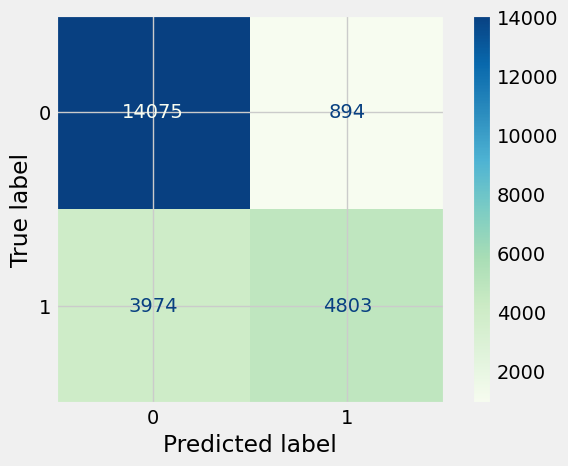

In [76]:
# Defining the class labels
classes = ["0", "1"]

# Creating a ConfusionMatrixDisplay object with the confusion matrix and class labels
disp = ConfusionMatrixDisplay(confusion_matrix=conf, display_labels=classes)

# Plotting the confusion matrix
disp.plot(
    include_values=True,            # Display the actual values in each cell of the confusion matrix
    cmap="GnBu",                    # Color map recognized by matplotlib
    ax=None,
    xticks_rotation="horizontal",
    values_format="d"
)

# Displaying the plot
plt.show()

## Model 2: KNN

In [77]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

y_pred= knn.predict(X_test)

acc_knn = accuracy_score(y_test, y_pred)
conf = confusion_matrix(y_test, y_pred)
clf_report = classification_report(y_test, y_pred)

model_result_print(acc_knn, conf, clf_report)

Accuracy Score: 0.8720626631853786
Confusion Matrix:
[[14223   746]
 [ 2292  6485]]
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.95      0.90     14969
           1       0.90      0.74      0.81      8777

    accuracy                           0.87     23746
   macro avg       0.88      0.84      0.86     23746
weighted avg       0.87      0.87      0.87     23746



## Model 3: Decision Tree

In [78]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

y_pred_dtc = dtc.predict(X_test)

acc_dtc = accuracy_score(y_test, y_pred_dtc)
conf = confusion_matrix(y_test, y_pred_dtc)
clf_report = classification_report(y_test, y_pred_dtc)

model_result_print(acc_dtc, conf, clf_report)

Accuracy Score: 0.9514865661585109
Confusion Matrix:
[[14404   565]
 [  587  8190]]
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96     14969
           1       0.94      0.93      0.93      8777

    accuracy                           0.95     23746
   macro avg       0.95      0.95      0.95     23746
weighted avg       0.95      0.95      0.95     23746



## Model 4: Random Forest

In [79]:
rd_clf = RandomForestClassifier()
rd_clf.fit(X_train, y_train)

y_pred_rd_clf = rd_clf.predict(X_test)

acc_rd_clf = accuracy_score(y_test, y_pred_rd_clf)
conf = confusion_matrix(y_test, y_pred_rd_clf)
clf_report = classification_report(y_test, y_pred_rd_clf)

model_result_print(acc_rd_clf, conf, clf_report)

Accuracy Score: 0.9590667901962435
Confusion Matrix:
[[14880    89]
 [  883  7894]]
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97     14969
           1       0.99      0.90      0.94      8777

    accuracy                           0.96     23746
   macro avg       0.97      0.95      0.96     23746
weighted avg       0.96      0.96      0.96     23746



## Model 5: AdaBoost

In [80]:
ada = AdaBoostClassifier(base_estimator = dtc)
ada.fit(X_train, y_train)

y_pred_ada = ada.predict(X_test)

acc_ada = accuracy_score(y_test, y_pred_ada)
conf = confusion_matrix(y_test, y_pred_ada)
clf_report = classification_report(y_test, y_pred_ada)

model_result_print(acc_ada, conf, clf_report)

Accuracy Score: 0.9509812178893288
Confusion Matrix:
[[14401   568]
 [  596  8181]]
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96     14969
           1       0.94      0.93      0.93      8777

    accuracy                           0.95     23746
   macro avg       0.95      0.95      0.95     23746
weighted avg       0.95      0.95      0.95     23746



## Model 6: Gradient Boosting

In [81]:
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)

y_pred_gb = gb.predict(X_test)

acc_gb = accuracy_score(y_test, y_pred_gb)
conf = confusion_matrix(y_test, y_pred_gb)
clf_report = classification_report(y_test, y_pred_gb)

model_result_print(acc_gb, conf, clf_report)

Accuracy Score: 0.9184283668828435
Confusion Matrix:
[[14868   101]
 [ 1836  6941]]
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.99      0.94     14969
           1       0.99      0.79      0.88      8777

    accuracy                           0.92     23746
   macro avg       0.94      0.89      0.91     23746
weighted avg       0.93      0.92      0.92     23746



## Model 7: XGBoost

In [82]:
xgb = XGBClassifier(booster='gbtree',
                    learning_rate=0.1,
                    max_depth=5,
                    n_estimators=180)

xgb.fit(X_train, y_train)

y_pred_xgb = xgb.predict(X_test)

acc_xgb = accuracy_score(y_test, y_pred_xgb)
conf = confusion_matrix(y_test, y_pred_xgb)
clf_report = classification_report(y_test, y_pred_xgb)

model_result_print(acc_xgb, conf, clf_report)

Accuracy Score: 0.9833235071169881
Confusion Matrix:
[[14961     8]
 [  388  8389]]
Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99     14969
           1       1.00      0.96      0.98      8777

    accuracy                           0.98     23746
   macro avg       0.99      0.98      0.98     23746
weighted avg       0.98      0.98      0.98     23746



## Model 8: CatBoost

In [83]:
cat = CatBoostClassifier(iterations=100)
cat.fit(X_train, y_train)

y_pred_cat = cat.predict(X_test)

acc_cat = accuracy_score(y_test, y_pred_cat)
conf = confusion_matrix(y_test, y_pred_cat)
clf_report = classification_report(y_test, y_pred_cat)

Learning rate set to 0.5
0:	learn: 0.4751950	total: 74.5ms	remaining: 7.37s
1:	learn: 0.4103089	total: 101ms	remaining: 4.93s
2:	learn: 0.3533162	total: 128ms	remaining: 4.15s
3:	learn: 0.3290288	total: 156ms	remaining: 3.75s
4:	learn: 0.2719964	total: 183ms	remaining: 3.48s
5:	learn: 0.2492809	total: 223ms	remaining: 3.5s
6:	learn: 0.2152680	total: 253ms	remaining: 3.36s
7:	learn: 0.1919798	total: 278ms	remaining: 3.19s
8:	learn: 0.1776196	total: 310ms	remaining: 3.13s
9:	learn: 0.1654123	total: 335ms	remaining: 3.01s
10:	learn: 0.1555010	total: 361ms	remaining: 2.92s
11:	learn: 0.1452096	total: 389ms	remaining: 2.85s
12:	learn: 0.1381840	total: 416ms	remaining: 2.78s
13:	learn: 0.1327333	total: 452ms	remaining: 2.78s
14:	learn: 0.1276281	total: 479ms	remaining: 2.71s
15:	learn: 0.1220959	total: 520ms	remaining: 2.73s
16:	learn: 0.1148288	total: 549ms	remaining: 2.68s
17:	learn: 0.1117521	total: 572ms	remaining: 2.6s
18:	learn: 0.1047829	total: 598ms	remaining: 2.55s
19:	learn: 0.1006

In [84]:
model_result_print(acc_cat, conf, clf_report)

Accuracy Score: 0.9961256632696033
Confusion Matrix:
[[14958    11]
 [   81  8696]]
Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     14969
           1       1.00      0.99      0.99      8777

    accuracy                           1.00     23746
   macro avg       1.00      1.00      1.00     23746
weighted avg       1.00      1.00      1.00     23746



## Model 9: Extra Trees Classifier

In [85]:
etc = ExtraTreesClassifier()
etc.fit(X_train, y_train)

y_pred_etc = etc.predict(X_test)

acc_etc = accuracy_score(y_test, y_pred_etc)
conf = confusion_matrix(y_test, y_pred_etc)
clf_report = classification_report(y_test, y_pred_etc)

model_result_print(acc_etc, conf, clf_report)

Accuracy Score: 0.9572559588983408
Confusion Matrix:
[[14830   139]
 [  876  7901]]
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97     14969
           1       0.98      0.90      0.94      8777

    accuracy                           0.96     23746
   macro avg       0.96      0.95      0.95     23746
weighted avg       0.96      0.96      0.96     23746



## Model 10: Light Gradient Boosting Machine

In [86]:
lgbm = LGBMClassifier(learning_rate = 1)
lgbm.fit(X_train, y_train)

y_pred_lgbm = lgbm.predict(X_test)

acc_lgbm = accuracy_score(y_test, y_pred_lgbm)
conf = confusion_matrix(y_test, y_pred_lgbm)
clf_report = classification_report(y_test, y_pred_lgbm)

model_result_print(acc_lgbm, conf, clf_report)

Accuracy Score: 0.9483281394761223
Confusion Matrix:
[[14368   601]
 [  626  8151]]
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96     14969
           1       0.93      0.93      0.93      8777

    accuracy                           0.95     23746
   macro avg       0.94      0.94      0.94     23746
weighted avg       0.95      0.95      0.95     23746



## Model 11: Voting Classifier

In [87]:
# This is a crucial modeling step: voting-based ensemble of multiple classifiers.
# Define the list of classifiers with their corresponding names
classifiers = [('Gradient Boosting Classifier', gb),
               ('Cat Boost Classifier', cat),
               ('XGboost', xgb),
               ('Decision Tree', dtc),
               ('Extra Tree', etc),
               ('Light Gradient', lgbm),
               ('Random Forest', rd_clf),
               ('Ada Boost', ada),
               ('Logistic', lr),
               ('Knn', knn)]

vc = VotingClassifier(estimators = classifiers)
vc.fit(X_train, y_train)

y_pred_vc = vc.predict(X_test)

acc_vtc = accuracy_score(y_test, y_pred_vc)
conf = confusion_matrix(y_test, y_pred_vc)
clf_report = classification_report(y_test, y_pred_vc)

Learning rate set to 0.5
0:	learn: 0.4751950	total: 27.3ms	remaining: 2.7s
1:	learn: 0.4103089	total: 53.3ms	remaining: 2.61s
2:	learn: 0.3533162	total: 80.4ms	remaining: 2.6s
3:	learn: 0.3290288	total: 107ms	remaining: 2.56s
4:	learn: 0.2719964	total: 134ms	remaining: 2.54s
5:	learn: 0.2492809	total: 161ms	remaining: 2.52s
6:	learn: 0.2152680	total: 190ms	remaining: 2.53s
7:	learn: 0.1919798	total: 232ms	remaining: 2.66s
8:	learn: 0.1776196	total: 257ms	remaining: 2.6s
9:	learn: 0.1654123	total: 284ms	remaining: 2.56s
10:	learn: 0.1555010	total: 310ms	remaining: 2.51s
11:	learn: 0.1452096	total: 338ms	remaining: 2.48s
12:	learn: 0.1381840	total: 367ms	remaining: 2.46s
13:	learn: 0.1327333	total: 395ms	remaining: 2.42s
14:	learn: 0.1276281	total: 428ms	remaining: 2.42s
15:	learn: 0.1220959	total: 456ms	remaining: 2.39s
16:	learn: 0.1148288	total: 485ms	remaining: 2.37s
17:	learn: 0.1117521	total: 515ms	remaining: 2.35s
18:	learn: 0.1047829	total: 553ms	remaining: 2.36s
19:	learn: 0.100

In [88]:
model_result_print(acc_vtc, conf, clf_report)

Accuracy Score: 0.9688368567337657
Confusion Matrix:
[[14966     3]
 [  737  8040]]
Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.98     14969
           1       1.00      0.92      0.96      8777

    accuracy                           0.97     23746
   macro avg       0.98      0.96      0.97     23746
weighted avg       0.97      0.97      0.97     23746



# Deep Learning Modeling with Keras

## Data Preprocessing and Splitting

In [89]:
# merge two DataFrame
X = pd.concat([cat_df, num_df], axis = 1)
# convert the target variable to categorical
y = to_categorical(df['is_canceled'])

In [92]:
X.shape, y.shape

((118726, 25), (118726, 2))

In [94]:
# split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

## Train Model

In [95]:
model = Sequential()

# Add the first hidden layer with 100 neurons and ReLU activation
model.add(Dense(100, activation="relu", input_shape=(X.shape[1], )))

# Add the second hidden layer with 100 neurons and ReLU activation
model.add(Dense(100, activation="relu"))

# Add the output layer with 2 neurons and sigmoid activation
model.add(Dense(2, activation="sigmoid"))

# Compile the model with Adam optimizer, binary cross-entropy loss, and accuracy metric
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

# Train the model on the training data and validate on the test data for 50 epochs
model_history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=50)

Epoch 1/50
2969/2969 [==============================] - 10s 3ms/step - loss: 0.4008 - accuracy: 0.8371 - val_loss: 0.1370 - val_accuracy: 0.9554
Epoch 2/50
2969/2969 [==============================] - 7s 3ms/step - loss: 0.1265 - accuracy: 0.9586 - val_loss: 0.0880 - val_accuracy: 0.9733
Epoch 3/50
2969/2969 [==============================] - 7s 2ms/step - loss: 0.0783 - accuracy: 0.9746 - val_loss: 0.1063 - val_accuracy: 0.9603
Epoch 4/50
2969/2969 [==============================] - 8s 3ms/step - loss: 0.0540 - accuracy: 0.9828 - val_loss: 0.0416 - val_accuracy: 0.9868
Epoch 5/50
2969/2969 [==============================] - 7s 2ms/step - loss: 0.0396 - accuracy: 0.9876 - val_loss: 0.0290 - val_accuracy: 0.9916
Epoch 6/50
2969/2969 [==============================] - 8s 3ms/step - loss: 0.0335 - accuracy: 0.9899 - val_loss: 0.0200 - val_accuracy: 0.9937
Epoch 7/50
2969/2969 [==============================] - 7s 2ms/step - loss: 0.0284 - accuracy: 0.9918 - val_loss: 0.0337 - val_accuracy

## Visualizing Evaluation

### loss

In [96]:
train_loss = model_history.history["loss"]
val_loss = model_history.history["val_loss"]

epoch = range(1, 51)

# Create a DataFrame to store the training and validation loss values for each epoch
loss = pd.DataFrame({"train_loss": train_loss,
                     "val_loss": val_loss
                    })

# Display the first few rows of the loss DataFrame
loss.head()

,train_loss,val_loss
0,0.400771,0.136966
1,0.126455,0.087978
2,0.078292,0.106326
3,0.054014,0.041605
4,0.039582,0.028996


In [97]:
px.line(loss,
        x=epoch,
        y=['val_loss','train_loss'],
        title='Train and Val Loss',
        template = 'plotly_dark')

### accuracy

In [98]:
train_acc = model_history.history["accuracy"]
val_acc = model_history.history["val_accuracy"]

epoch = range(1,51)

acc = pd.DataFrame({"train_acc": train_acc,
                     "val_acc":val_acc
                    })

px.line(acc,
        x=epoch,
        y=['val_acc','train_acc'],
        title = 'Train and Val Accuracy',
        template = 'plotly_dark')

## Final Model

In [99]:
# Final model accuracy
acc_ann = model.evaluate(X_test, y_test)[1]
acc_ann

743/743 [==============================] - 1s 2ms/step - loss: 0.0046 - accuracy: 0.9985


0.9984839558601379

# Model Comparison

In [101]:
models = pd.DataFrame({
    'Model' : ['Logistic Regression', 'KNN',
               'Decision Tree Classifier',
               'Random Forest Classifier',
               'Ada Boost Classifier',
               'Gradient Boosting Classifier',
               'XgBoost', 'Cat Boost',
               'Extra Trees Classifier',
               'LGBM', 'Voting Classifier','ANN'],
    'Score' : [acc_lr, acc_knn, acc_dtc,
               acc_rd_clf, acc_ada, acc_gb,
               acc_xgb, acc_cat, acc_etc,
               acc_lgbm, acc_vtc, acc_ann]
})


models = models.sort_values(by = 'Score', ascending = False, ignore_index=True)

models["Score"] = models["Score"].apply(lambda x: round(x,4))
models

,Model,Score
0,ANN,0.9985
1,Cat Boost,0.9961
2,XgBoost,0.9833
3,Voting Classifier,0.9688
4,Random Forest Classifier,0.9591
5,Extra Trees Classifier,0.9573
6,Decision Tree Classifier,0.9515
7,Ada Boost Classifier,0.9510
8,LGBM,0.9483
9,Gradient Boosting Classifier,0.9184


In [103]:
# Visualization
models = models.sort_values(by = 'Score', ascending = True, ignore_index=True)
px.bar(models,
       x="Score",
       y="Model",
       text="Score",
       color="Score",
       template="plotly_dark",
       title="Models Comparision"
      )

### In conclusion, based on the accuracy scores, the ANN model outperformed all other models with accuracy of 99.85%, followed closely by the Cat Boost. These models demonstrate strong predictive capabilities.